
# Crime in Boston | Project Exercise

**CONTENT**

1. **Install-Module That Needed**

2. **Import Libary**

3. **Changing Data Type**

4. **Missing Value Analysis**

5. **Exploratory Data**
    
    A. Create New Vars
        A.1. Season
        A.2. Day & Night
        
    B. Question, Analysis & Answers | How has crime changed over the years?
        B.1. Number crimes over the years
        B.2. Number crimes of the season
        B.3. Number crimes of the month
        B.4. Number crimes by month of the year
        B.5. Answer
        
    C. Question, Analysis & Answers | is it possible to predict where or when a crime will be committed?
        C.1. When did the most crime happen?
        C.2. Where the most crime happens?

    D. Question, Analysis & Answers | What can the distribution of different offenses be over the city?
    
    
6. **Conclusion**

# 1. __ Install Module That Needed __

In [8]:
pip install folium

     |████████████████████████████████| 95 kB 1.5 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install pandas-profiling

     |████████████████████████████████| 268 kB 1.4 MB/s eta 0:00:01
     |████████████████████████████████| 3.0 MB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 102 kB 5.5 MB/s eta 0:00:01
     |████████████████████████████████| 694 kB 3.4 MB/s eta 0:00:01
     |████████████████████████████████| 296 kB 3.7 MB/s eta 0:00:01
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=815e03fc0024491c1059f718f46d726072a485f44c233f72eac867ff769e2787
  Stored in directory: /Users/dymaslawula/Library/Caches/pip/wheels/1d/05/04/c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin
Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install xgboost

     |████████████████████████████████| 1.7 MB 1.5 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


<hr>

# 2. __Import Library__

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import pandas_profiling
import plotly.express as px

from sklearn import preprocessing
import datetime as dt

from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
df_offense_codes = pd.read_csv('/Users/dymaslawula/Documents/data001/offense_codes.csv', encoding='windows-1254')

In [6]:
df_bostonCrime = pd.read_csv('/Users/dymaslawula/Documents/data001/crime.csv', encoding='windows-1254')
df_bostonCrime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [7]:
df_bostonCrime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [8]:
print(df_bostonCrime.isnull().sum(), end = '\n\n')
print(df_bostonCrime[(df_bostonCrime['Lat'].isnull()) | (df_bostonCrime['Long'].isnull())]['Location'].unique())

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

['(0.00000000, 0.00000000)']


In [9]:
df_bostonCrime.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,319073.000000,319073.000000,319073.000000,319073.000000,299074.000000,299074.000000
mean,2317.546956,2016.560586,6.609719,13.118205,42.214381,-70.908272
std,1185.285543,0.996344,3.273691,6.294205,2.159766,3.493618
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297442,-71.097135
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077524
75%,3201.000000,2017.000000,9.000000,18.000000,42.348624,-71.062467
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


In [10]:
df_bostonCrime.describe().T

,count,mean,std,min,25%,50%,75%,max
OFFENSE_CODE,319073.0,2317.546956,1185.285543,111.000000,1001.000000,2907.000000,3201.000000,3831.000000
YEAR,319073.0,2016.560586,0.996344,2015.000000,2016.000000,2017.000000,2017.000000,2018.000000
MONTH,319073.0,6.609719,3.273691,1.000000,4.000000,7.000000,9.000000,12.000000
HOUR,319073.0,13.118205,6.294205,0.000000,9.000000,14.000000,18.000000,23.000000
Lat,299074.0,42.214381,2.159766,-1.000000,42.297442,42.325538,42.348624,42.395042
Long,299074.0,-70.908272,3.493618,-71.178674,-71.097135,-71.077524,-71.062467,-1.000000


In [11]:
df_offense_codes.head()

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


These are the offense codes and their names, however, we can see that the crime_data also contains the offense codes and their names, so we don't need this **offense_codes** dataset

In [12]:
df_offense_codes['NAME'][df_offense_codes['CODE'] == 619]

161           LARCENY ALL OTHERS
312    LARCENY OTHER $200 & OVER
Name: NAME, dtype: object

In [165]:
df_bostonCrime['OFFENSE_DESCRIPTION'][df_bostonCrime['OFFENSE_CODE'] == 619]

0                LARCENY ALL OTHERS
45               LARCENY ALL OTHERS
110              LARCENY ALL OTHERS
150              LARCENY ALL OTHERS
205              LARCENY ALL OTHERS
                    ...            
318911    LARCENY OTHER $200 & OVER
318983    LARCENY OTHER $200 & OVER
318993    LARCENY OTHER $200 & OVER
319026           LARCENY ALL OTHERS
319048    LARCENY OTHER $200 & OVER
Name: OFFENSE_DESCRIPTION, Length: 5665, dtype: object

<hr>

# 3. __Changing Data Type (datetime to date)__

I will convert the ``OCCURRED_ON_DATE`` value types from ``datetime`` to ``date``. Because I will use that data for my analyst that focus on ``date`` only

In [13]:
df_bostonCrime["OCCURRED_ON_DATE"] = df_bostonCrime["OCCURRED_ON_DATE"].apply(pd.to_datetime, errors='coerce')
df_bostonCrime["OCCURRED_ON_DATE"] = df_bostonCrime["OCCURRED_ON_DATE"].dt.date

In [14]:
df_bostonCrime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [15]:
df_bostonCrime["OCCURRED_ON_DATE"]

0         2018-09-02
1         2018-08-21
2         2018-09-03
3         2018-09-03
4         2018-09-03
             ...    
319068    2016-06-05
319069    2015-07-09
319070    2015-07-09
319071    2016-05-31
319072    2015-06-22
Name: OCCURRED_ON_DATE, Length: 319073, dtype: object

The ``OCCURRED_ON_DATE`` value types already convert from ``datetime`` to ``date``

<hr>

# 4. Missing Value Analysis

In [16]:
# how much missing data
total = df_bostonCrime.isnull().sum().sort_values(ascending=False)
percent = (df_bostonCrime.isnull().sum()/df_bostonCrime.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(8)

,Total,Percent
SHOOTING,318054,0.996806
Long,19999,0.062678
Lat,19999,0.062678
STREET,10871,0.034071
DISTRICT,1765,0.005532
UCR_PART,90,0.000282
INCIDENT_NUMBER,0,0.000000
DAY_OF_WEEK,0,0.000000


* 99% of the Shooting column consists of null values. Assuming these mean no, we can replace it with N. (Yes = there is shooting, No = no shooting)
* Also, 0.06% of the Lat and Long values are missing. Since we have a small number of null values compared to our data, we can remove them.
* Let's remove the remaining missing values from our data.

In [17]:
df_bostonCrime.SHOOTING.fillna('N', inplace=True)

In [18]:
df_bostonCrime=df_bostonCrime.dropna()

In [19]:
total = df_bostonCrime.isnull().sum().sort_values(ascending=False)
percent = (df_bostonCrime.isnull().sum()/df_bostonCrime.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(8)

,Total,Percent
INCIDENT_NUMBER,0,0.0
MONTH,0,0.0
Long,0,0.0
Lat,0,0.0
STREET,0,0.0
UCR_PART,0,0.0
HOUR,0,0.0
DAY_OF_WEEK,0,0.0


In [20]:
df_bostonCrime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,N,2018-09-02,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,N,2018-08-21,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,N,2018-09-03,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,N,2018-09-03,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,N,2018-09-03,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [180]:
df_bostonCrime.to_csv("Data_Crime_Boston CSV")

<hr>

# 5. Exploratory Data

In [21]:
df_bostonCrime.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')

``OFFENCE_CODE`` there are a lot uniqe for each ``OFFENCE_CODE_GROUP``.

In [22]:
OFFENSE_CODE__ = df_bostonCrime.groupby('OFFENSE_CODE_GROUP')['OFFENSE_CODE'].nunique().sort_values(ascending = False)
OFFENSE_CODE__.to_frame().reset_index()

,OFFENSE_CODE_GROUP,OFFENSE_CODE
0,Drug Violation,26
1,Other,21
2,Larceny,13
3,Motor Vehicle Accident Response,11
4,Robbery,10
...,...,...
58,Landlord/Tenant Disputes,1
59,Investigate Property,1
60,Investigate Person,1
61,Homicide,1


## A. Create New Vars

The We have ``years`` and ``months`` in our data, but we create the seasons column to see seasonality.

### **A.1. Season**

In [23]:
def season__(month):
    if (month == 12 or month == 1 or month == 2):
       return "Winter"
    elif(month == 3 or month == 4 or month == 5):
       return "Spring"
    elif(month ==6 or month==7 or month == 8):
       return "Summer"
    else:
       return "Fall"

In [24]:
df_bostonCrime['SEASON'] = df_bostonCrime.MONTH.apply(season__)

**A.2. Day & Night**

In [25]:
df_bostonCrime['Day'] = 0
df_bostonCrime['Night'] = 0
# Day or night for 1st month
df_bostonCrime['Day'].loc[(df_bostonCrime['HOUR'] >= 6) & (df_bostonCrime['HOUR'] <= 18)] = 1

df_bostonCrime['Night'].loc[df_bostonCrime['Day']==0]=1

## B. Question, Analysis & Answers | How has crime changed over the years?

### **B.1. Number crime over the years**

Text(0.5, 1.0, 'Crime of each year')

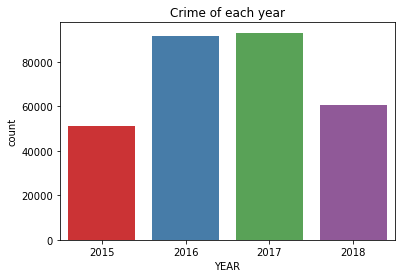

In [26]:
sns.countplot(data = df_bostonCrime, x='YEAR', palette='Set1')
plt.title('Crime of each year')

There were more crimes in 2016 and 2017 than in other years. Look in more detail to understand the reason for this.

### **B.2. Number crime of the season**

   SEASON  INCIDENT_NUMBER
0    Fall            70627
1  Spring            68902
2  Summer            92751
3  Winter            64293


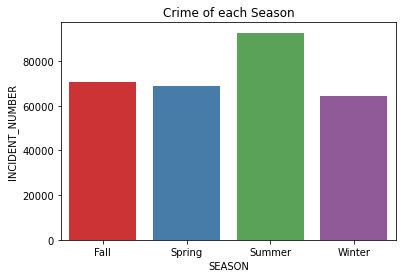

In [27]:
crime_of_season = df_bostonCrime.groupby('SEASON').count()['INCIDENT_NUMBER'].to_frame().reset_index()
ax = sns.barplot(x = 'SEASON', y = "INCIDENT_NUMBER", data = crime_of_season, palette='Set1')
plt.title('Crime of each Season')
print(crime_of_season)

There were more crimes in **Summer** than in other season. 

### **B.3. Number crime of the month**

    MONTH  INCIDENT_NUMBER
0       1            22187
1       2            20078
2       3            22273
3       4            22410
4       5            24219
5       6            28496
6       7            32050
7       8            32205
8       9            24662
9      10            23874
10     11            22091
11     12            22028


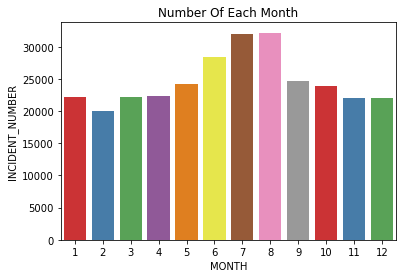

In [28]:
crime_by_month = df_bostonCrime.groupby('MONTH').count()['INCIDENT_NUMBER'].to_frame().reset_index()
ax = sns.barplot(x = 'MONTH' , y="INCIDENT_NUMBER", data = crime_by_month, palette='Set1')
plt.title('Number Of Each Month')
print(crime_by_month)

There were more crimes in **July and August** than in other month. 

  DAY_OF_WEEK  INCIDENT_NUMBER
0      Friday            45133
1      Monday            42469
2    Saturday            41569
3      Sunday            37677
4    Thursday            43283
5     Tuesday            42997
6   Wednesday            43445


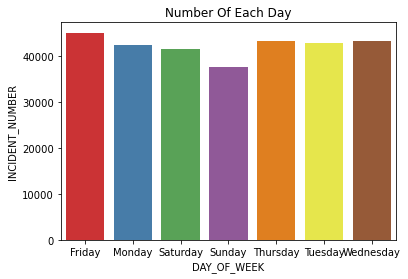

In [30]:
crime_by_day = df_bostonCrime.groupby('DAY_OF_WEEK').count()['INCIDENT_NUMBER'].to_frame().reset_index()
ax = sns.barplot(x = 'DAY_OF_WEEK' , y="INCIDENT_NUMBER", data = crime_by_day, palette='Set1')
plt.title('Number Of Each Day')
print(crime_by_day)

There were more crimes in **Friday**, if i look that not much difference with other day

### **B.4. Number crime by month of the year**

    MONTH  YEAR  INCIDENT_NUMBER
0       1  2016             7511
1       1  2017             7453
2       1  2018             7223
3       2  2016             6800
4       2  2017             6850
5       2  2018             6428
6       3  2016             7584
7       3  2017             7520
8       3  2018             7169
9       4  2016             7546
10      4  2017             7469
11      4  2018             7395
12      5  2016             7957
13      5  2017             8053
14      5  2018             8209
15      6  2015             4060
16      6  2016             7965
17      6  2017             8311
18      6  2018             8160
19      7  2015             8033
20      7  2016             7837
21      7  2017             8315
22      7  2018             7865
23      8  2015             8025
24      8  2016             8081
25      8  2017             8414
26      8  2018             7685
27      9  2015             8046
28      9  2016             7745
29      9 

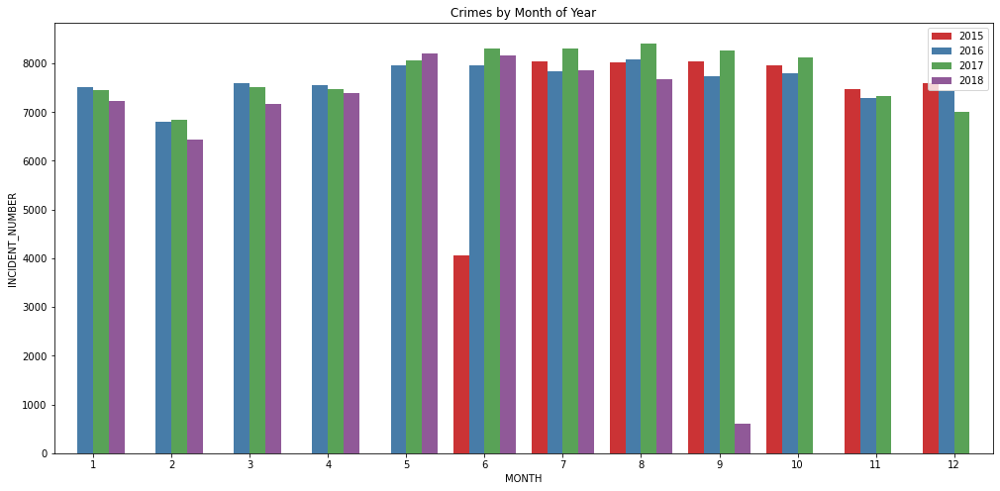

In [31]:
fig, ax = plt.subplots(figsize=(17,8))


mont_year_combined = pd.DataFrame(df_bostonCrime.groupby(["MONTH","YEAR"])["INCIDENT_NUMBER"].count()).reset_index()
a=sns.barplot(data=mont_year_combined,x="MONTH", y="INCIDENT_NUMBER",hue = 'YEAR', palette='Set1')
a.set_title("Crimes by Month of Year",fontsize=12)
plt.legend(loc='upper right')
print(mont_year_combined)
plt.show()

According to the chart aboe, I cant able to check the first 5 months of 2015 (Red Collor) and the last 3 months of 2018 (Purple Collor). From chart we can see the high crime happen in Juni, July and August.

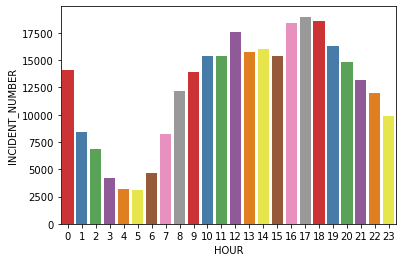

In [32]:
crime_by_hour = df_bostonCrime.groupby(['HOUR']).count()['INCIDENT_NUMBER'].to_frame().reset_index()
ax = sns.barplot(x = 'HOUR' , y="INCIDENT_NUMBER", data = crime_by_hour,  palette='Set1')

According to the chart above, surprisely the high crime happen not in the midnight but the crime much happen in 16 - 19 pm

### **B.5. Answer:**

YEAR
2015    51187
2016    91545
2017    93097
2018    60744
Name: INCIDENT_NUMBER, dtype: int64


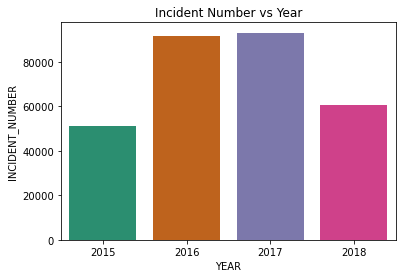

In [33]:
plt.title('Incident Number vs Year')
counts_by_yearSS = df_bostonCrime.groupby('YEAR').count()['INCIDENT_NUMBER'].to_frame().reset_index()
print(df_bostonCrime.groupby('YEAR').count()['INCIDENT_NUMBER'])
ax = sns.barplot(x = 'YEAR' , y="INCIDENT_NUMBER", data = counts_by_yearSS, palette='Dark2')

<Figure size 576x576 with 0 Axes>

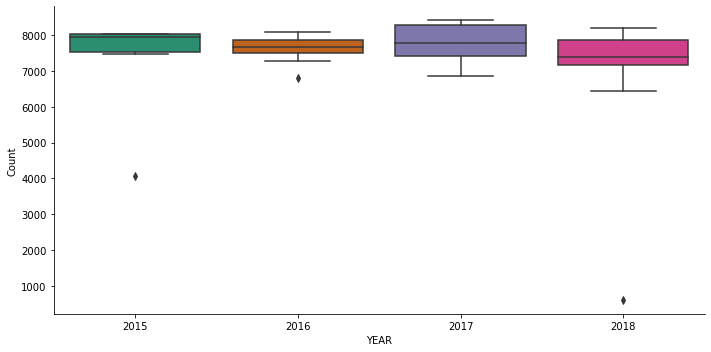

In [34]:
data_year=df_bostonCrime.groupby(["YEAR","MONTH"])["INCIDENT_NUMBER"].count().reset_index()
data_year_filter=data_year[~data_year['MONTH'].isin(['1','2','3','4','5','11','12'])]
fig = plt.figure(figsize=(8,8))
with sns.color_palette("Dark2",4):
    ctplt2=sns.catplot(x="YEAR", y="INCIDENT_NUMBER",kind="box", data=data_year,size=5, aspect=2)
    plt.ylabel('Count')
    plt.show();

In [35]:
print('Count of Months Per Year:\n',df_bostonCrime.groupby('YEAR')['MONTH'].nunique())
avg_month = (df_bostonCrime.groupby('YEAR').count()['INCIDENT_NUMBER'] / df_bostonCrime.groupby('YEAR')['MONTH'].nunique()).to_frame().reset_index()

print('\nAverage monthly incident per year:\n',avg_month)
avg_month.rename(columns = {0:'Avg MONTHLY INCIDENT'}, inplace = True)

Count of Months Per Year:
 YEAR
2015     7
2016    12
2017    12
2018     9
Name: MONTH, dtype: int64

Average monthly incident per year:
    YEAR            0
0  2015  7312.428571
1  2016  7628.750000
2  2017  7758.083333
3  2018  6749.333333


   YEAR  Avg MONTHLY INCIDENT
0  2015           7312.428571
1  2016           7628.750000
2  2017           7758.083333
3  2018           6749.333333


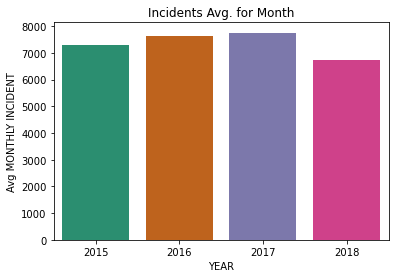

In [36]:
print(avg_month)

plt.title('Incidents Avg. for Month')
ax = sns.barplot(x = 'YEAR', y = "Avg MONTHLY INCIDENT", data = avg_month, palette='Dark2')

Average of daily casesare very close to each other. The daily average increases a some of incidents from **2015** to **2016** and increase a some from **2016** to **2017** as well while there is around 7 incident decrease from **2017** to **2018**.

I would like to consider my data on a daily basis to make the most accurate assumptions

In [37]:
df_bostonCrime['OCCURRED_ON_DATE'] = pd.to_datetime(df_bostonCrime['OCCURRED_ON_DATE'])

counts_by_yearSS01 = df_bostonCrime.groupby('YEAR').count()['INCIDENT_NUMBER'].to_numpy()

days = [(df_bostonCrime[df_bostonCrime['YEAR'] == YEAR__].OCCURRED_ON_DATE.max() - df_bostonCrime[df_bostonCrime['YEAR'] == YEAR__].OCCURRED_ON_DATE.min()).days for YEAR__ in df_bostonCrime.YEAR.sort_values().unique()]

average_daily_incidents = counts_by_yearSS01/days


print("Average Daily Crimes:  ")
print([str(year)+": "+str(avg)[:4] for year, avg in enumerate(average_daily_incidents, 2015)])

Average Daily Crimes:  
['2015: 257.', '2016: 250.', '2017: 255.', '2018: 247.']


       Counts
0  257.221106
1  250.808219
2  255.760989
3  247.934694


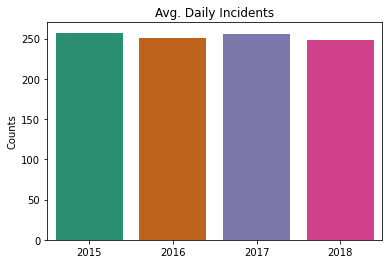

In [38]:
day_avg = pd.DataFrame(data = average_daily_incidents, index = avg_month.index)
day_avg.rename(columns = {0:'Counts'}, inplace = True)
plt.title('Avg. Daily Incidents')

dataYearsort = sns.barplot(x = day_avg.index , y="Counts", data = day_avg,palette ='Dark2' )
dataYearsort.set_xticklabels(df_bostonCrime.YEAR.sort_values().unique())

print(day_avg)

Based on graphs above shown **2015** is high than **2016** that differenct with the data Average monthly incident per year which is shown increases a some of incidents from **2015** to **2016**

I wanna look my data from a daily basis to weekly basis to make the most accurate assumptions

In [39]:
crime_weekend = df_bostonCrime[(df_bostonCrime['DAY_OF_WEEK'] == 'Saturday') | (df_bostonCrime['DAY_OF_WEEK'] == 'Sunday')]
crime_weekday = df_bostonCrime[(df_bostonCrime['DAY_OF_WEEK']!= 'Saturday') & (df_bostonCrime['DAY_OF_WEEK'] != 'Sunday')]

weekday_year = crime_weekday.groupby('YEAR').count()['INCIDENT_NUMBER'].to_frame()
weekend_year = crime_weekend.groupby('YEAR').count()['INCIDENT_NUMBER'].to_frame()

* **Weekend**

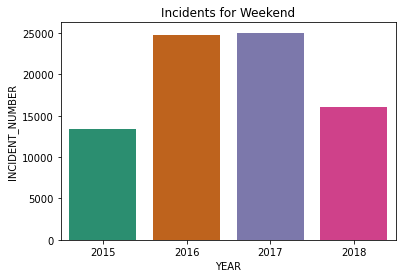

In [40]:
plt.title('Incidents for Weekend')
ax = sns.barplot(x = weekend_year.index , y="INCIDENT_NUMBER", data = weekend_year,palette='Dark2')

* **Weekday**

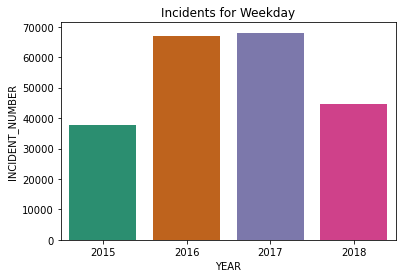

In [41]:
plt.title('Incidents for Weekday')
ax = sns.barplot(x = weekday_year.index , y="INCIDENT_NUMBER", data = weekday_year,palette='Dark2')

As seen in the graphs above, there is no significant difference in the number of cases on weekdays and weekends.

However, if we go deeper and look on a day basis, we see that there is no significant difference. We have to care about missing data in our analysis.

## C. Question, Analysis & Answers | is it possible to predict where or when a crime will be committed?

### **C.1. When the most crime happen?**

Text(-9.074999999999989, 0.5, 'Count')

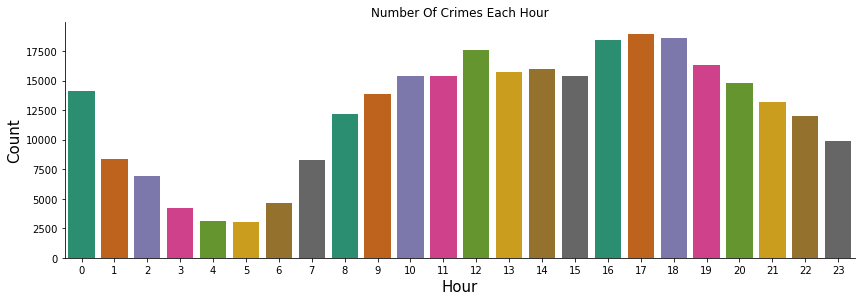

In [42]:
sns.catplot(x='HOUR',
            kind='count',
            height=4, 
            aspect=3,
            palette='Dark2',
            #color='BrBG',
           data=df_bostonCrime)
plt.title('Number Of Crimes Each Hour')
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlabel('Hour', fontsize=15)
plt.ylabel('Count', fontsize=15)

In the chart above, we see that the most crimes occur around 17:00, 18:00 and 12:00. The reason for this may be that students / employees coincide with work hours and breaks. The number of crimes is likely to increase with the increasing number of people on the street.

* **Incident counts day at week per year**

<AxesSubplot:xlabel='YEAR,DAY_OF_WEEK'>

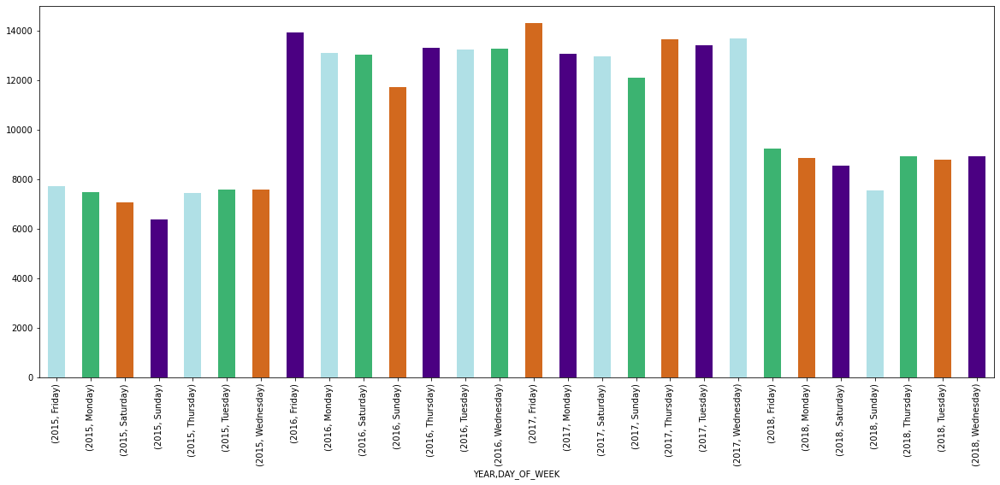

In [43]:
plt.figure(figsize=(20,8))
df_bostonCrime.groupby(['YEAR','DAY_OF_WEEK']).count()['INCIDENT_NUMBER'].plot.bar(color = ['powderblue', 'Mediumseagreen', 'chocolate', 'indigo'])

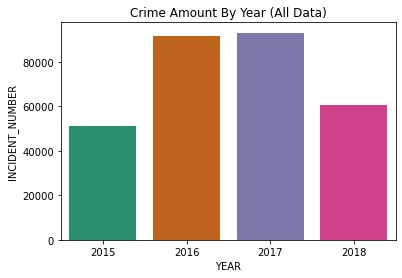

In [44]:
plt.title("Crime Amount By Year (All Data)")
years = df_bostonCrime.groupby('YEAR').count()['INCIDENT_NUMBER'].to_frame().reset_index()
ax = sns.barplot(x = 'YEAR' , y="INCIDENT_NUMBER", data = years, palette='Dark2')

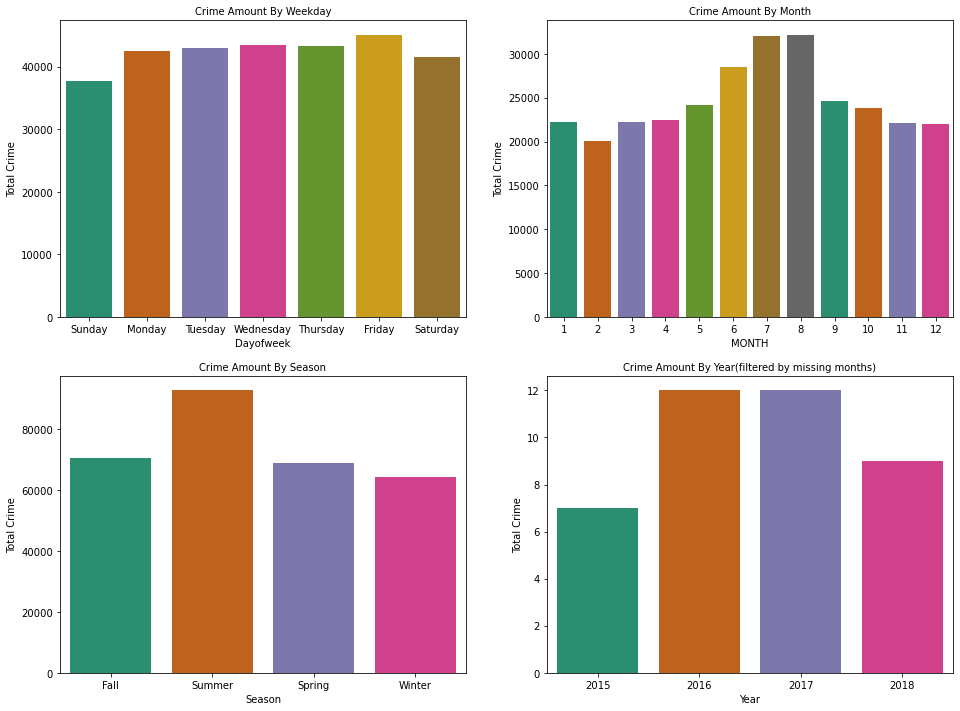

In [45]:
fig,axes= plt.subplots(2,2)
fig.set_size_inches(16,12)
with sns.color_palette('Dark2',4):
  a=sns.countplot(x="DAY_OF_WEEK",order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],data=df_bostonCrime,ax=axes[0, 0],palette='Dark2')
  a.set(xlabel='Dayofweek', ylabel='Total Crime')
  a.set_title("Crime Amount By Weekday",fontsize=10)

  b=sns.countplot(x="MONTH",data=df_bostonCrime,ax=axes[0, 1],palette='Dark2')
  b.set(xlabel='MONTH', ylabel='Total Crime')
  b.set_title("Crime Amount By Month",fontsize=10)

  c=sns.countplot(x="SEASON",data=df_bostonCrime,ax=axes[1, 0])
  c.set(xlabel='Season', ylabel='Total Crime')
  c.set_title("Crime Amount By Season",fontsize=10)


   
  d=sns.countplot(x="YEAR",data=data_year_filter,ax=axes[1, 1])
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set_title("Crime Amount By Year(filtered by missing months)",fontsize=10);

* When we plot again by taking only the months of data entered, we can see that the crime entries are close in the chart called Crime Amount By Year and 2015 is lower than the others. 
 
* Most crimes seem to be on Friday. The months with the most crimes appear to be July and August (Crime Amount By Month chart), which coincides with the summer season in the Crime Amount By Season chart.

Crimes can behave differently over the years. We can say that the  Medical Assistance crimes saw a rise over the years. We can observe a similar trend with the Investigate Person Crime type.

Text(0.05, 0.95, 'Timeline of the most frequent crimes(2015-2018).')

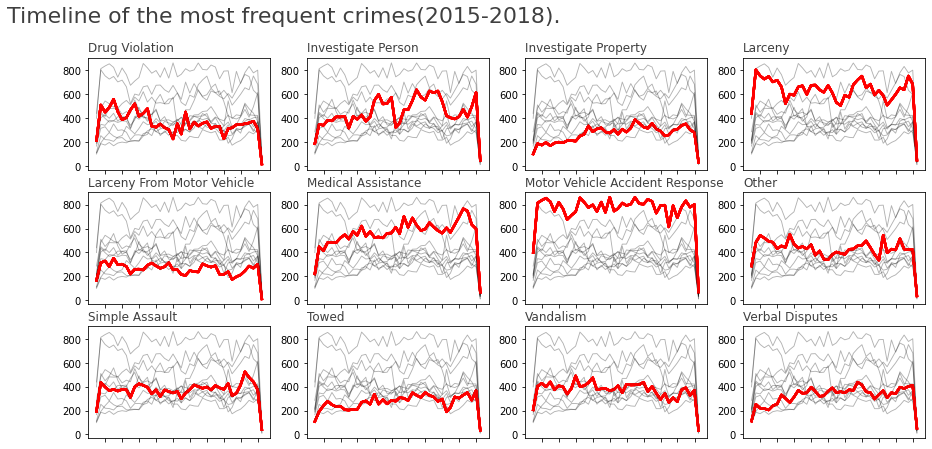

In [46]:
ten_freq_crimes = df_bostonCrime["OFFENSE_CODE_GROUP"].value_counts()[:12]
df_top_crimes = df_bostonCrime[df_bostonCrime["OFFENSE_CODE_GROUP"].isin(ten_freq_crimes.index)]
df_tp = df_top_crimes.pivot_table(index=df_top_crimes["OCCURRED_ON_DATE"],
columns=["OFFENSE_CODE_GROUP"],aggfunc="size", fill_value=0).resample("M").sum()

#palette = plt.get_cmap('Set2')
num=0
ax,fix = plt.subplots(figsize=(15,7))
for column in df_tp:
    num+=1
    plt.subplot(3,4, num)
    for v in df_tp:
        plt.plot(df_tp.index,v,data=df_tp,marker='', color='black', linewidth=0.9, alpha=0.3)
        plt.tick_params(labelbottom=False)
        plt.plot(df_tp.index,column, data=df_tp,color="red", linewidth=2.4, alpha=0.75, label=column)
        plt.title(column, loc='left', fontsize=12, fontweight=0, color="black", alpha=0.75)
ax.text(x=0.05,y=0.95,s="Timeline of the most frequent crimes(2015-2018).",alpha=0.75, fontsize=22)

### **C.2. Where the most crime happen?**

* **Number Of Crimes By District**

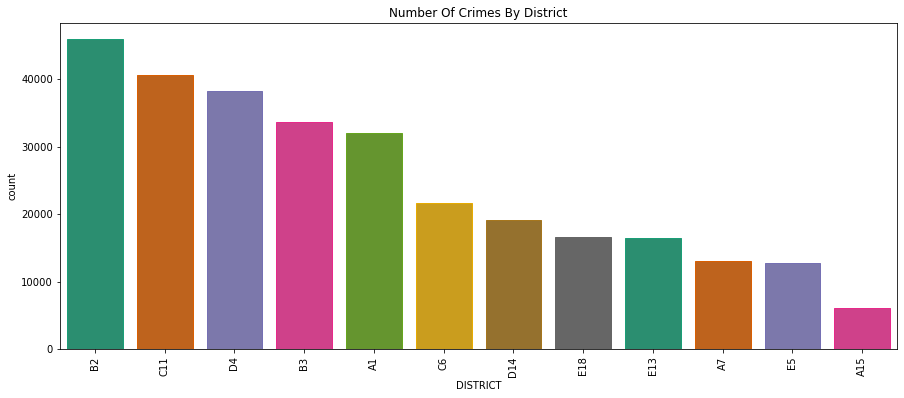

In [47]:
plt.subplots(figsize=(15,6))
sns.countplot('DISTRICT',palette='Dark2',data=df_bostonCrime,edgecolor=sns.color_palette('Dark2',20),order=df_bostonCrime['DISTRICT'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Number Of Crimes By District')
plt.show()

From the graph above, we can say that the most crimes occur in the B2 district.

* **Crime Numbers of Districts by Years**

<AxesSubplot:xlabel='DISTRICT,YEAR'>

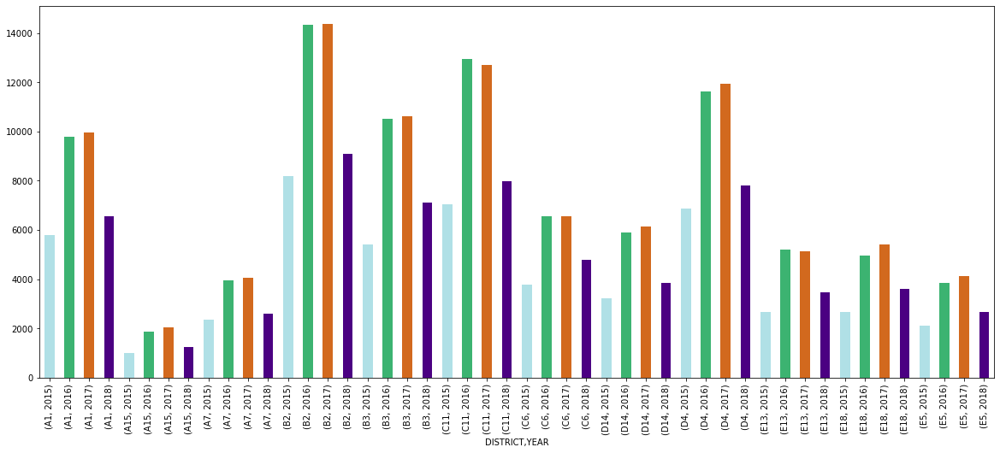

In [48]:
plt.figure(figsize=(20,8))
df_bostonCrime.groupby(['DISTRICT','YEAR']).count()['INCIDENT_NUMBER'].plot.bar(color = ['powderblue', 'Mediumseagreen', 'chocolate', 'indigo'])

From the graph above, More crime appears in all districts in 2016 and 2017. It was no surprise.

* **Crime Numbers of Streets**

how many streets a district has?

In [49]:
(df_bostonCrime.groupby('DISTRICT')['STREET'].nunique().sort_values(ascending = False).to_frame()).head()

,STREET
DISTRICT,
C11,605
B2,579
E5,508
E18,416
B3,403


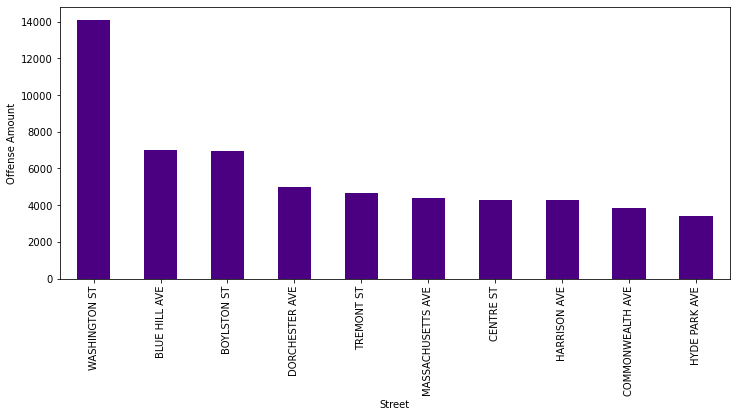

In [50]:
fig = plt.figure(figsize=(12,5))
crime_street = df_bostonCrime.groupby('STREET')['INCIDENT_NUMBER'].count().nlargest(10)
crime_street.plot(kind='bar', color ="indigo")
plt.xlabel("Street")
plt.ylabel("Offense Amount")
plt.show()

In the plot above, we can see the streets with the most crime. According to the chart, Washington St is the street with the most crime, it is Blue Hill Ave and Boylston St, is following.

In this graph, I can see the distribution of crimes by district. I can interpret that theft crime was mostly seen in the D4 region, and the crimes in the motor vehicle accident group were seen in the B2 district. By looking at which time, which street, which crime was most committed in which district, etc., I can speculate on where and when the possible crimes will be committed.

I can guess the districts and streets. Classification will be useful here. But we have too many streets, that could be a problem.
* That the most crimes occur in the B2 district.
* The streets with the most crime.
* How the offense code groups are distributed to districts.
* Find crime centers with clustering method. We can use these as police stations.

## D. Question, Analysis & Answers | What can the distribution of different offenses be over the city?

<AxesSubplot:xlabel='Lat', ylabel='Long'>

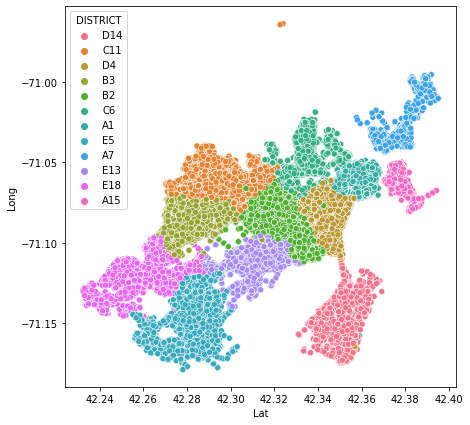

In [51]:
plt.figure(figsize=(7,7))
sp_data = df_bostonCrime[(df_bostonCrime['Lat'] != -1) & (df_bostonCrime['Long'] != -1)]
sns.scatterplot(x="Lat", y="Long",hue='DISTRICT',data=sp_data)

* **Check crime types**

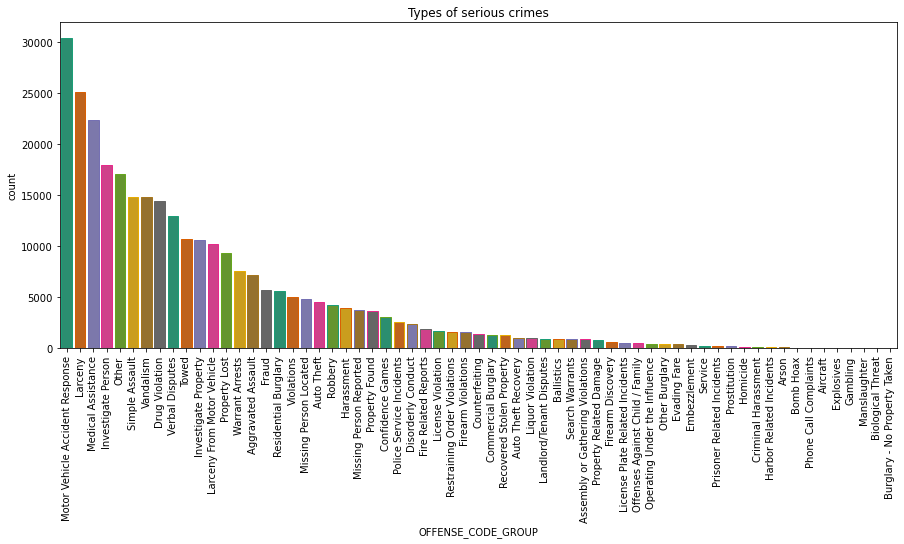

In [52]:
plt.subplots(figsize=(15,6))
sns.countplot('OFFENSE_CODE_GROUP',palette='Dark2',data=df_bostonCrime,edgecolor=sns.color_palette('Dark2',20),order=df_bostonCrime['OFFENSE_CODE_GROUP'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Types of serious crimes')
plt.show()

According to the graph above, the most common crimes are motor vehicle accident and larcency.

* **Offense Code Group by districts**

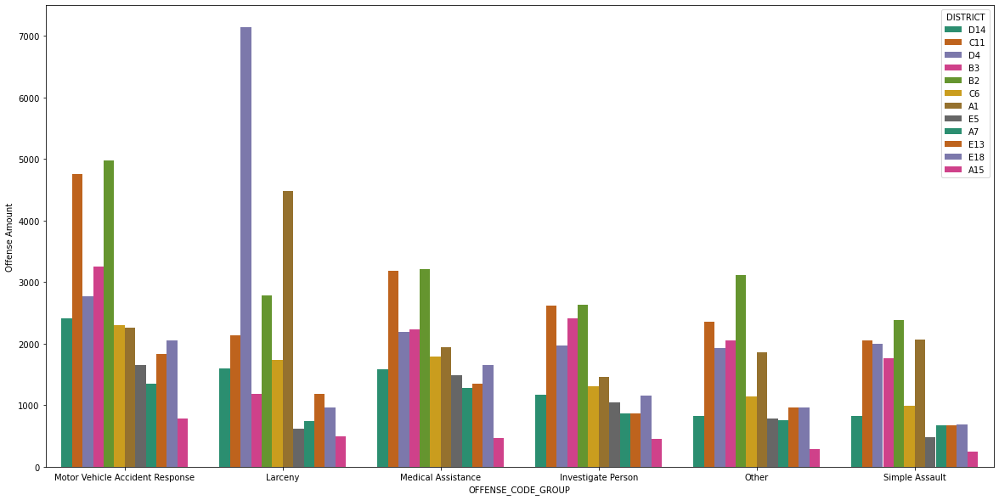

In [53]:
fig = plt.figure(figsize=(20,10))
oo22 = df_bostonCrime['OFFENSE_CODE_GROUP'].value_counts().head(6).index
sns.countplot(data = df_bostonCrime, x='OFFENSE_CODE_GROUP',hue='DISTRICT', order = oo22, palette='Dark2' );
plt.ylabel("Offense Amount");

The relationship between Offense_Code_Group and District.
According to the graph above, the most larceny crime occurred in D4 district.

* **Relationship between districts and shooting**

In [54]:
shootuu01 = df_bostonCrime[(df_bostonCrime.SHOOTING == 'Y') & (df_bostonCrime.DISTRICT.notnull())]

import folium
import folium.plugins as plugins

latitude = list(shootuu01.Lat)[1]
longitude = list(shootuu01.Long)[1] 

latitudes = list(shootuu01.Lat)
longitudes = list(shootuu01.Long)

shootuu01_map = folium.Map(location = [latitude, longitude], zoom_start = 12) 
shooting = plugins.MarkerCluster().add_to(shootuu01_map) 

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(shootuu01.Lat, shootuu01.Long, shootuu01.DISTRICT):
    if (not np.isnan(lat)) & (not np.isnan(lng)): 
        folium.Marker(
            location=[lat, lng],
#             icon=None,
            popup=label,
            icon=folium.Icon(icon='exclamation-sign')
        ).add_to(shooting)

# display the map
shootuu01_map

I can see which streets and intersections are intense with **Shooting** Crimes.

In [55]:
# Folium crime map
crimeMap = folium.Map(location=[42.3125,-71.0875], 
            zoom_start = 13)

 

data_Map = df_bostonCrime[['Lat','Long']]
data_Map = df_bostonCrime.dropna(axis=0, subset=['Lat','Long'])
data_Map = [[row['Lat'],row['Long']] for index, row in data_Map.iterrows()]
HeatMap(data_Map, radius=10).add_to(crimeMap)

crimeMap

According to the graph above, i can abble looking where the crime happen intents in the boston area. By looking at the map, I can speculate when crimes are concentrated in the city.

**The 3 most committed crimes spread to the city**

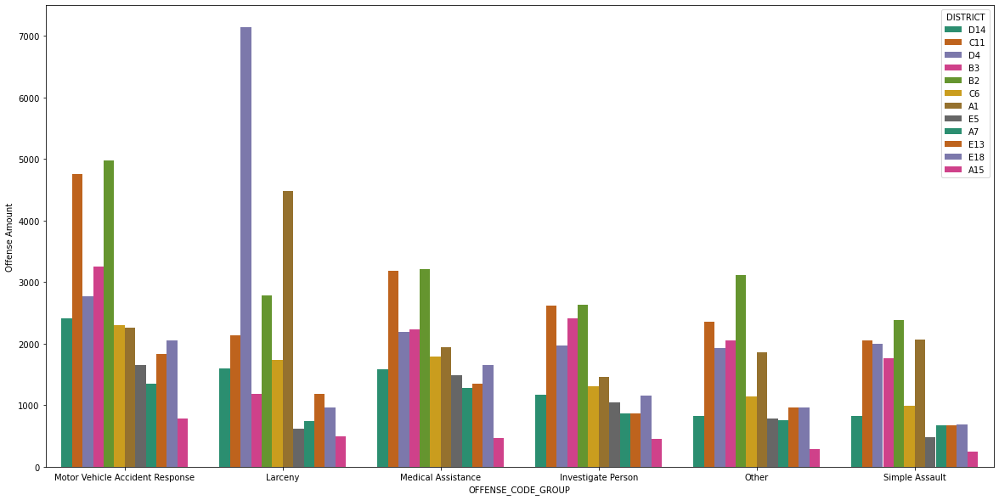

In [56]:
fig = plt.figure(figsize=(20,10))
oo22 = df_bostonCrime['OFFENSE_CODE_GROUP'].value_counts().head(6).index
sns.countplot(data = df_bostonCrime, x='OFFENSE_CODE_GROUP',hue='DISTRICT', order = oo22, palette='Dark2' );
plt.ylabel("Offense Amount");

Motor Vehicle Accident Response

In [57]:
ds001 = df_bostonCrime.dropna(subset = ['Lat','Long','DISTRICT'])
ds001 = ds001[ds001['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']
location = pd.DataFrame(data =(ds001.groupby(["Lat","Long"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["Lat","Long","INCIDENT_NUMBER"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="INCIDENT_NUMBER",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

Larceny

In [58]:
ds001 = df_bostonCrime.dropna(subset = ['Lat','Long','DISTRICT'])
ds001 = ds001[ds001['OFFENSE_CODE_GROUP'] == 'Larceny']
location = pd.DataFrame(data =(ds001.groupby(["Lat","Long"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["Lat","Long","INCIDENT_NUMBER"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="INCIDENT_NUMBER",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

Medical Assistance

In [59]:
ds001 = df_bostonCrime.dropna(subset = ['Lat','Long','DISTRICT'])
ds001 = ds001[ds001['OFFENSE_CODE_GROUP'] == 'Medical Assistance']
location = pd.DataFrame(data =(ds001.groupby(["Lat","Long"]).count()[['INCIDENT_NUMBER']]).reset_index().values, columns=["Lat","Long","INCIDENT_NUMBER"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="INCIDENT_NUMBER",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

<hr>

# 6. Conclusions 

## Conclusions for : 
## * (B) How has crime changed over the years?
## * (C) Possible to predict where or when a crime will be committed?
## * (D) What can the distribution of different offenses over the city?

**(B). How has crime changed over the years??**

* If I look at the number of crimes committed year over year, there were fewer crimes in 2015 and 2018. There were 6 months lost in 2015 and 3 months in 2018. So, a significant decline this year is most likely caused by these missing values. If I look by filtering it based on the lunar data we have, I can say that the distribution of crime from year to year is close.

**(C). Possible to predict where or when a crime will be committed?**

* In Winter crime is more, It might be because of long nights, short days streets are less populated people are covered so easy to disguise people are covered so they can hide the Weapons Difficult to catch as unfavorable weather conditions Visual range is reduced 

* In summer Crime is low People are more active in the street, more daylight most populated streets lesser and light clothes, difficult to hide weapons late at sunset

* Most crimes occur on Fridays. The months with the most crime are July and August (Crime By Month Graph), which coincides with summer in the Crime Count By Season chart.

* We see that most crimes occur around 17:00, 18:00, and 12:00. This may be because students/staff coincide with departure and break times. The number of crimes tends to increase as the number of people on the street increases.

* From the graph above, it can be said that most crimes occur in district B2.
* Washington St is the most criminal street, it is Blue Hill Ave and Boylston St. is following.

* So, assuming that subsequent crimes follow the same pattern as those in 2015-2018, based on my analysis, I can speculate which crimes could be committed in which regions in the future.

**(D). Possible to predict where or when a crime will be committed?**

* The most common crimes are motor vehicle accidents and larceny.

* It can be said that the most crimes of theft occur in district D4, and crimes in the motor vehicle accident group are seen in district B2.

* By looking at the heat map, we can speculate when crime is concentrated in the city.

* There is no homogeneous distribution in the city of Boston. Crime is most likely committed in the central area.

## Recommendation and Advice

* Sunday is safer for people as compared to other weekdays, it can be seen that On Sunday the crime count is below 50,000.  
* Morning hours from 1 am to 7 am, is the time when crime freq is very less, so people would be safer around this time 4 am-11am.
* For the security forces, dispatch personnel to priority locations, especially the B2 district with more crimes than other districts.
* For Bostonians, they can be more careful in the summer, because the number of crimes in the summer is more than in other seasons from year to year data.
* Prepare special police for areas most prone to shooting crime.